# **Emotions - Emoji - data preprocessing and choice of the dataset **

# Necessary libraries

In [2]:
import cv2

import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd 

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Model, Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D
from keras.optimizers import Adam
from keras.layers import MaxPooling2D
from keras.preprocessing.image import ImageDataGenerator

# Descriptive Statistics on the original dataset

In [3]:
# set the filepath to the folder containing train/test images
data_dir = ['data/train','data/test']

# define the column names as a list
column_names = ['Directory', 'Category', 'ImagePath']

# create an empty DataFrame with the specified column names
df = pd.DataFrame({}, columns=column_names)


for folder_path in data_dir:
    # use os.listdir() to get a list of all categories in the folders train/test
    subfolder = os.listdir(folder_path)
    for category in subfolder:
        category_path = os.path.join(folder_path, category)
        images = os.listdir(category_path)
        # create a new row of data as a dictionary
        for image in images:
            image_path = os.path.join(category_path, image)
            new_row = {'Directory': folder_path, 'Category': category, 'ImagePath': image_path}
            df = df.append(new_row, ignore_index=True)

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppData\Local\Temp\ipykernel_8100\3414033361.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)
C:\Users\Zucch\AppDa

In [4]:
# Let's view How much images we have in each category, for both the training set and the test set:

# create a pivot table with the desired structure
pivot_table = pd.pivot_table(df, values='ImagePath', index=['Category'], columns=['Directory'], aggfunc='count')

# Sum the number of images by catögory
pivot_table = pivot_table.assign(total=pivot_table.sum(axis=1))

# print the pivot table
print(pivot_table)



Directory  data/test  data/train  total
Category                               
angry            958        3995   4953
disgust          111         436    547
fear            1024        4097   5121
happy           1774        7215   8989
neutral         1233        4965   6198
sad             1247        4830   6077
surprise         831        3171   4002


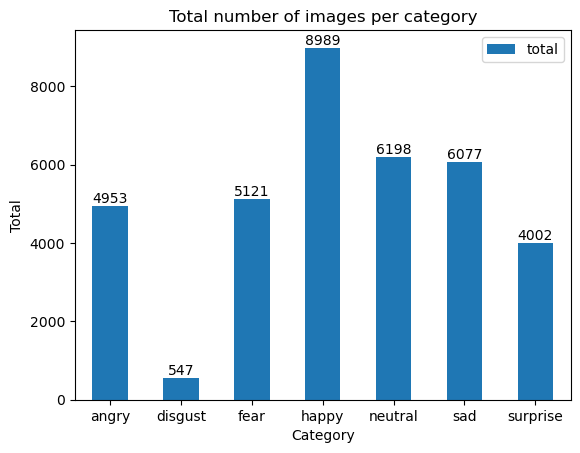

In [5]:
# create a bar chart with the categories on the x-axis and bars of height total
ax = pivot_table.plot(kind='bar', y='total', rot=0)

# add data labels to the bars with some space between the bars and the labels
for i, v in enumerate(pivot_table['total']):
    ax.text(i, v+1, str(v), ha='center', va='bottom')

# add axis labels and a title
plt.xlabel('Category')
plt.ylabel('Total')
plt.title('Total number of images per category')

# display the plot
plt.show()

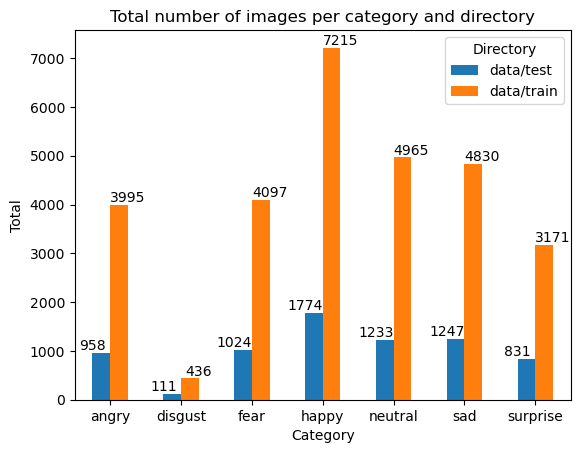

In [6]:
# drop the 'total' column
pivot_table = pivot_table.drop('total', axis=1)

# create a bar chart with the categories on the x-axis, and split bars by directory
ax = pivot_table.plot(kind='bar', rot=0)

# add data labels to the bars with some space between the bars and the labels
for i, v in enumerate(pivot_table.sum(axis=1)):
    #ax.text(i, v+1.5, str(v), ha='center', va='bottom')
    for j, w in enumerate(pivot_table.iloc[i]):
        ax.text(i+(j-0.5)/2, w+0.5, str(w), ha='center', va='bottom')

# add axis labels and a title
plt.xlabel('Category')
plt.ylabel('Total')
plt.title('Total number of images per category and directory')

# display the plot
plt.show()

In [7]:
# Print the initial total number of images in the test set and in the train set
# print the total number of images in each directory
for col in pivot_table.columns:
    print(f'Total number of images in {col}: {pivot_table[col].sum()}')

Total number of images in data/test: 7178
Total number of images in data/train: 28709


In [8]:
# Split the DataFrame into vectors (Series) for each column
nb_test = pivot_table['data/test']
nb_train = pivot_table['data/train']
nb_total = [train + test for train, test in zip(nb_train, nb_test)]

# Retrieve the 'Category' vector from the pivot table

categories = pivot_table.index

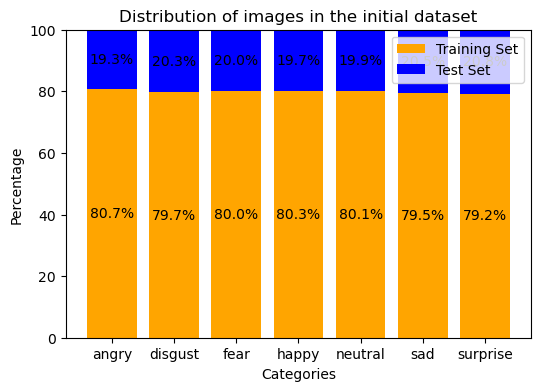

In [9]:
# Create the figure with a smaller size
fig, ax = plt.subplots(figsize=(6, 4)) 

# Calculate the desired figure size based on the available space
available_width = 800  # Adjust the available width as needed
aspect_ratio = 16 / 9  # Adjust the aspect ratio as needed

fig_width = available_width / 80  # Convert to inches
fig_height = fig_width / aspect_ratio

# Adjust the figure size
plt.rcParams['figure.figsize'] = [fig_width, fig_height]


train_percentages = [train / total * 100 for train, total in zip(nb_train, nb_total)]
test_percentages = [test / total * 100 for test, total in zip(nb_test, nb_total)]



# Plot the stacked bars
train_bars = ax.bar(categories, train_percentages, label='Training Set', color='orange')
test_bars = ax.bar(categories, test_percentages, bottom=train_percentages, label='Test Set', color='blue')

# Set the y-axis limits to 0-100%
ax.set_ylim(0, 100)

# Add data labels to the bars
def autolabel(bars):
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_y() + height / 2, f'{height:.1f}%', ha='center', va='center')

autolabel(train_bars)
autolabel(test_bars)

# Add labels and a legend
ax.set_xlabel('Categories')
ax.set_ylabel('Percentage')
ax.set_title('Distribution of images in the initial dataset')
ax.legend()

# Display the chart
plt.show()

# Loading images

### Referencing the directories

In [10]:
train_dir = 'data/train'
val_dir = 'data/test'

### Save the initial images from the training set in a numpy array without any preprocessing

In [11]:
train_datagen = ImageDataGenerator(
        rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        directory=train_dir,
        target_size=(48,48),
        batch_size=32, # doesn't matter here as we don't generate data on the flow but load them to a file
        color_mode="grayscale",
        class_mode='categorical')

X_train = []
y_train = []

for i in range(len(train_generator)):
    images, labels = train_generator[i]

    # Append the images and labels to the respective lists
    X_train.append(images)
    y_train.append(labels)

# Concatenate the image arrays along the batch axis
X_train = np.concatenate(X_train, axis=0)

# Concatenate the label arrays along the batch axis
y_train = np.concatenate(y_train, axis=0)

Found 28709 images belonging to 7 classes.


In [12]:
print(X_train.shape)
print(y_train.shape)

(28709, 48, 48, 1)
(28709, 7)


### Count how many images you have in each class in the train set

In [13]:
num_images = X_train.shape[0]
class_counts = np.bincount(np.argmax(y_train, axis=1), minlength=y_train.shape[1])
class_labels = list(train_generator.class_indices.keys())

for i in range(y_train.shape[1]):
    print("Class {} ({}): {} images".format(i, class_labels[i], class_counts[i]))

Class 0 (angry): 3995 images
Class 1 (disgust): 436 images
Class 2 (fear): 4097 images
Class 3 (happy): 7215 images
Class 4 (neutral): 4965 images
Class 5 (sad): 4830 images
Class 6 (surprise): 3171 images


### Perform data augmentation - 7'000 images per category

In [14]:
import os
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img

train_datagen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=30, # dataset_balanced : 15 / dataset_balanced2 : 30 
        shear_range=0.2, # dataset_balanced : 0.1 / dataset_balanced2 : 0.2 
        zoom_range=0.2, # dataset_balanced : 0.1 / dataset_balanced2 : 0.2 
        horizontal_flip=True,
        fill_mode='nearest')

train_generator = train_datagen.flow_from_directory(
        directory=train_dir,
        target_size=(48,48),
        # No influence from batch size here on the performance of the model 
        batch_size=64,
        color_mode="grayscale",
        class_mode='categorical')

num_classes = len(train_generator.class_indices)
max_samples_per_class = 7000
samples_per_class = [0] * num_classes
X_train_balanced = []
y_train_balanced = []

for i, (inputs, labels) in enumerate(train_generator):
    class_indices = np.argmax(labels, axis=1)
    for j, class_index in enumerate(class_indices):
        if samples_per_class[class_index] < max_samples_per_class:
            samples_per_class[class_index] += 1
            X_train_balanced.append(inputs[j])
            y_train_balanced.append(labels[j])
    if min(samples_per_class) >= max_samples_per_class:
        break

X_train_balanced = np.asarray(X_train_balanced)
y_train_balanced = np.asarray(y_train_balanced)

print(X_train_balanced.shape)
print(y_train_balanced.shape)

Found 28709 images belonging to 7 classes.
(49000, 48, 48, 1)
(49000, 7)


### Count how many images you have in each class after the data augmentation in the train set

In [15]:
num_images = X_train_balanced.shape[0]
class_counts = np.bincount(np.argmax(y_train_balanced, axis=1), minlength=y_train_balanced.shape[1])
class_labels = list(train_generator.class_indices.keys())

for i in range(y_train_balanced.shape[1]):
    print("Class {} ({}): {} images".format(i, class_labels[i], class_counts[i]))

Class 0 (angry): 7000 images
Class 1 (disgust): 7000 images
Class 2 (fear): 7000 images
Class 3 (happy): 7000 images
Class 4 (neutral): 7000 images
Class 5 (sad): 7000 images
Class 6 (surprise): 7000 images


### No data augmentation is needed on the test set as we want to compare all different train set performance by using the same test set

In [16]:
test_datagen = ImageDataGenerator(
        rescale=1./255)

test_generator = test_datagen.flow_from_directory(
        directory=val_dir,
        target_size=(48,48),
        batch_size=32,
        color_mode="grayscale",
        class_mode='categorical')

X_test = []
y_test = []

for i in range(len(test_generator)):
    images, labels = test_generator[i]

    # Append the images and labels to the respective lists
    X_test.append(images)
    y_test.append(labels)

# Concatenate the image arrays along the batch axis
X_test = np.concatenate(X_test, axis=0)

# Concatenate the label arrays along the batch axis
y_test = np.concatenate(y_test, axis=0)

Found 7178 images belonging to 7 classes.


In [17]:
print(X_test.shape)
print(y_test.shape)

(7178, 48, 48, 1)
(7178, 7)


#### Count how many images you have in each class in the test set

In [18]:
num_images = X_test.shape[0]
class_counts = np.bincount(np.argmax(y_test, axis=1), minlength=y_test.shape[1])
class_labels = list(test_generator.class_indices.keys())

for i in range(y_test.shape[1]):
    print("Class {} ({}): {} images".format(i, class_labels[i], class_counts[i]))

Class 0 (angry): 958 images
Class 1 (disgust): 111 images
Class 2 (fear): 1024 images
Class 3 (happy): 1774 images
Class 4 (neutral): 1233 images
Class 5 (sad): 1247 images
Class 6 (surprise): 831 images


### Plot one image of each class

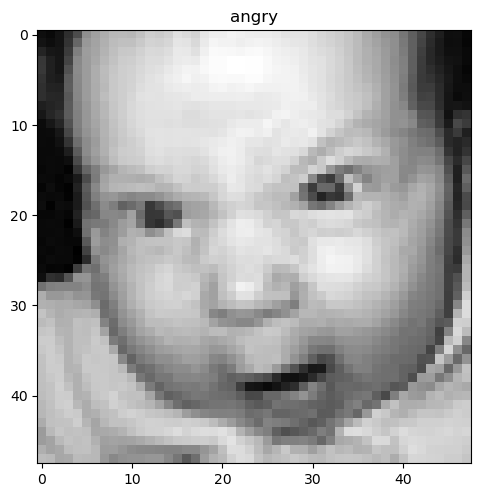

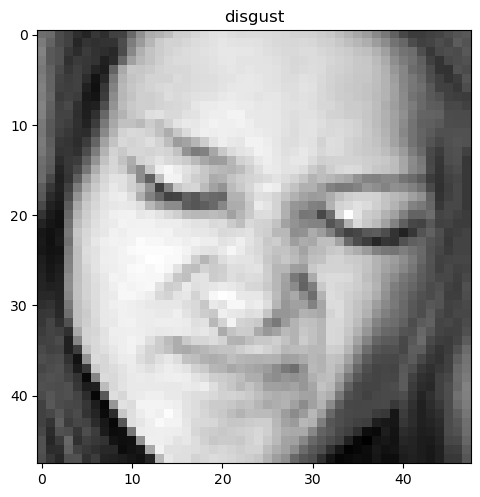

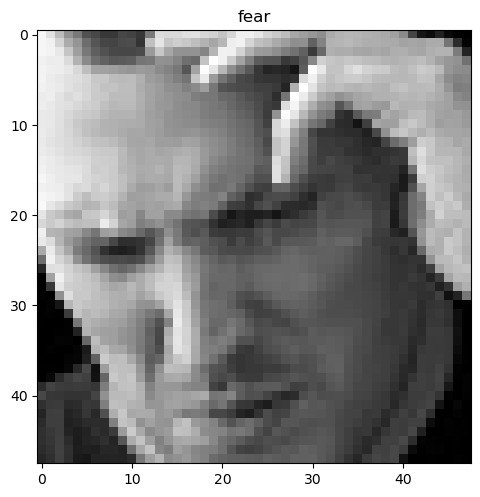

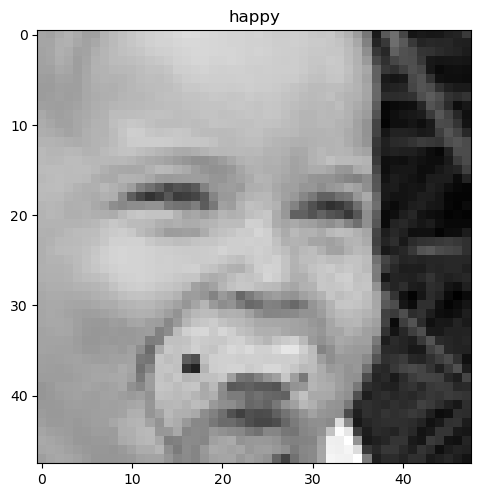

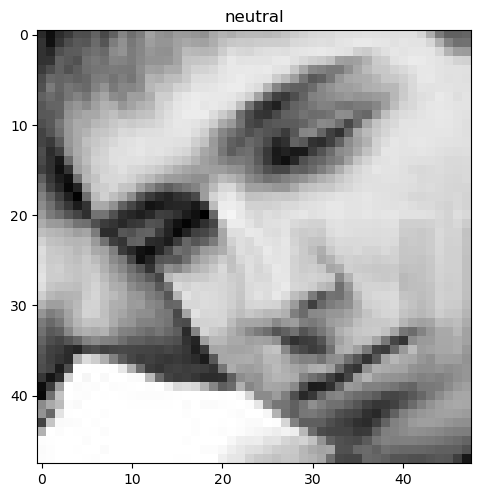

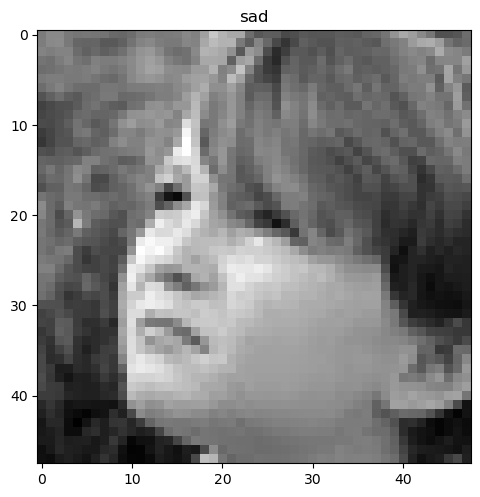

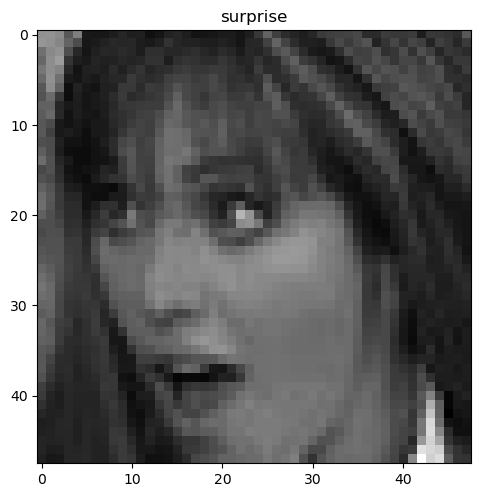

In [19]:
class_labels = list(train_generator.class_indices.keys())

for i in range(y_train.shape[1]):
    class_index = np.argmax(y_train[:, i])
    image_index = np.where(y_train[:, i] == 1)[0][0]
    image = X_train[image_index]
    plt.imshow(image, cmap = 'gray') # plot the images in a grey scale
    plt.title(class_labels[i])
    plt.show()

### Plot the neutral image during different data augmentation techniques

In [20]:
class_index = np.argmax(y_train[:, 5])
image_index = np.where(y_train[:, 5] == 1)[0][0]
image = X_train[image_index]

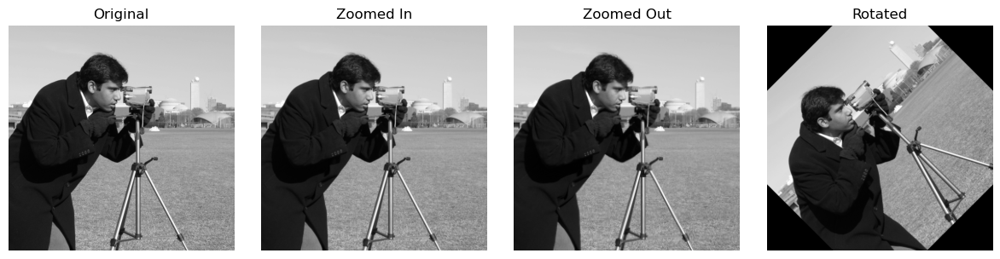

In [21]:
import matplotlib.pyplot as plt
from skimage import data, transform

# Load the original image (you can replace this with your own image)
original_image = data.camera()

# Apply data augmentation techniques
zoomed_in_image = transform.rescale(original_image, scale=2.0)
zoomed_out_image = transform.rescale(original_image, scale=0.5)
rotated_image = transform.rotate(original_image, angle=45)

# Plot the images
fig, axes = plt.subplots(1, 4, figsize=(12, 3))

axes[0].imshow(original_image, cmap='gray')
axes[0].set_title('Original')

axes[1].imshow(zoomed_in_image, cmap='gray')
axes[1].set_title('Zoomed In')

axes[2].imshow(zoomed_out_image, cmap='gray')
axes[2].set_title('Zoomed Out')

axes[3].imshow(rotated_image, cmap='gray')
axes[3].set_title('Rotated')

for ax in axes:
    ax.axis('off')

plt.tight_layout()
plt.show()

### Descriptive statistics on the augmented dataset

In [25]:
# Split the DataFrame into vectors (Series) for each column
new_nb_train_values = [7000, 7000, 7000, 7000, 7000, 7000, 7000]
nb_train.loc[categories] = new_nb_train_values
nb_total = [train + test for train, test in zip(nb_train, nb_test)]

In [26]:
print(nb_train)
print(nb_test)
print(nb_total)

Category
angry       7000
disgust     7000
fear        7000
happy       7000
neutral     7000
sad         7000
surprise    7000
Name: data/train, dtype: int64
Category
angry        958
disgust      111
fear        1024
happy       1774
neutral     1233
sad         1247
surprise     831
Name: data/test, dtype: int64
[7958, 7111, 8024, 8774, 8233, 8247, 7831]


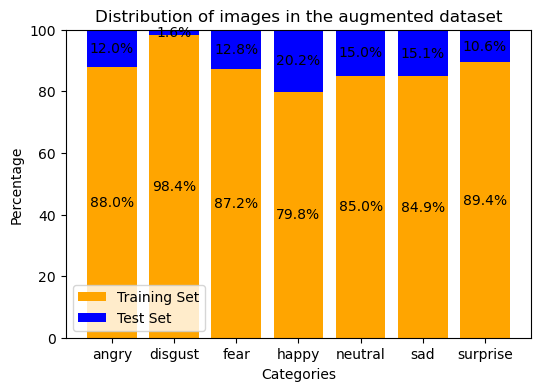

In [28]:
# Create the figure with a smaller size
fig, ax = plt.subplots(figsize=(6, 4)) 

# Calculate the desired figure size based on the available space
available_width = 800  # Adjust the available width as needed
aspect_ratio = 16 / 9  # Adjust the aspect ratio as needed

fig_width = available_width / 80  # Convert to inches
fig_height = fig_width / aspect_ratio

# Adjust the figure size
plt.rcParams['figure.figsize'] = [fig_width, fig_height]


train_percentages = [train / total * 100 for train, total in zip(nb_train, nb_total)]
test_percentages = [test / total * 100 for test, total in zip(nb_test, nb_total)]



# Plot the stacked bars
train_bars = ax.bar(categories, train_percentages, label='Training Set', color='orange')
test_bars = ax.bar(categories, test_percentages, bottom=train_percentages, label='Test Set', color='blue')

# Set the y-axis limits to 0-100%
ax.set_ylim(0, 100)

# Add data labels to the bars
def autolabel(bars):
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_y() + height / 2, f'{height:.1f}%', ha='center', va='center')

autolabel(train_bars)
autolabel(test_bars)

# Add labels and a legend
ax.set_xlabel('Categories')
ax.set_ylabel('Percentage')
ax.set_title('Distribution of images in the augmented dataset')
ax.legend()

# Display the chart
plt.show()

### Save the initial dataset  (without data augmentation) in a dictionary and in a pickle file

In [51]:
import pickle

# create a python dictionary  with 4 key-value pair 
# where the keys are named X_train, X_test, y_train, y_test 
# and the values are the objects X_train, X_test, y_train, y_test 

data_dict = {
    'X_train': X_train,
    'X_test': X_test,
    'y_train': y_train,
    'y_test': y_test
}

# Opens a file named dataset.pickle in binary mode for writing ('wb'). 
# The file will be used to store the serialized data.
with open('dataset_initial.pickle', 'wb') as handle:
    pickle.dump(data_dict, handle) # serializes the dictionary a and writes it to the file.
    
# opens the same file dataset.pickle in binary mode for reading ('rb'). 
# The file will be used to retrieve the serialized data.    
with open('dataset_initial.pickle', 'rb') as handle:
    data_dict2 = pickle.load(handle)


### Save the "balanced" dataset  (with data augmentation) in a dictionary and in a pickle file

In [17]:
import pickle

# create a python dictionary  with 4 key-value pair 
# where the keys are named X_train, X_test, y_train, y_test 
# and the values are the objects X_train, X_test, y_train, y_test 

data_dict = {
    'X_train': X_train_balanced,
    'X_test': X_test,
    'y_train': y_train_balanced,
    'y_test': y_test
}

# Opens a file named dataset.pickle in binary mode for writing ('wb'). 
# The file will be used to store the serialized data.
with open('dataset_balanced2.pickle', 'wb') as handle:  
    pickle.dump(data_dict, handle) # serializes the dictionary a and writes it to the file.
    
# opens the same file dataset.pickle in binary mode for reading ('rb'). 
# The file will be used to retrieve the serialized data.    
with open('dataset_balanced2.pickle', 'rb') as handle:
    data_dict2 = pickle.load(handle)


# Build the initial model

Initial model

In [18]:
emotion_model = Sequential() #code original

emotion_model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(48,48,1)))
emotion_model.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
emotion_model.add(MaxPooling2D(pool_size=(2, 2)))
emotion_model.add(Dropout(0.25))
emotion_model.add(Conv2D(128, kernel_size=(3, 3), activation='relu'))
emotion_model.add(MaxPooling2D(pool_size=(2, 2)))
emotion_model.add(Conv2D(128, kernel_size=(3, 3), activation='relu'))
emotion_model.add(MaxPooling2D(pool_size=(2, 2)))
emotion_model.add(Dropout(0.25))
emotion_model.add(Flatten())
emotion_model.add(Dense(1024, activation='relu'))
emotion_model.add(Dropout(0.5))
emotion_model.add(Dense(7, activation='softmax'))

optimizer =tf.keras.optimizers.Adam(learning_rate=0.0001)
emotion_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [19]:
emotion_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 46, 46, 32)        320       
                                                                 
 conv2d_1 (Conv2D)           (None, 44, 44, 64)        18496     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 22, 22, 64)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 22, 22, 64)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 20, 20, 128)       73856     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 10, 10, 128)      0         
 2D)                                                    

# Fit the initial model on the initial dataset

In [21]:
epochs = 30
batch_size = 64

with open('dataset_initial.pickle', 'rb') as handle:
    data_dict = pickle.load(handle)

# Extract the data from the data_dict
X_train = data_dict['X_train']
X_test = data_dict['X_test']
y_train = data_dict['y_train']
y_test = data_dict['y_test']

history = emotion_model.fit(
        X_train, 
        y_train, 
        epochs=epochs, 
        batch_size=batch_size, 
        validation_data=(X_test, y_test))

Epoch 1/30
449/449 [==============================] - 102s 225ms/step - loss: 1.7845 - accuracy: 0.2701 - val_loss: 1.6637 - val_accuracy: 0.3533
Epoch 2/30
449/449 [==============================] - 127s 283ms/step - loss: 1.6010 - accuracy: 0.3763 - val_loss: 1.5116 - val_accuracy: 0.4250
Epoch 3/30
449/449 [==============================] - 141s 314ms/step - loss: 1.4976 - accuracy: 0.4197 - val_loss: 1.4298 - val_accuracy: 0.4570
Epoch 4/30
449/449 [==============================] - 134s 298ms/step - loss: 1.4307 - accuracy: 0.4521 - val_loss: 1.3765 - val_accuracy: 0.4741
Epoch 5/30
449/449 [==============================] - 133s 297ms/step - loss: 1.3717 - accuracy: 0.4756 - val_loss: 1.3383 - val_accuracy: 0.4875
Epoch 6/30
449/449 [==============================] - 138s 307ms/step - loss: 1.3292 - accuracy: 0.4917 - val_loss: 1.3128 - val_accuracy: 0.5029
Epoch 7/30
449/449 [==============================] - 131s 292ms/step - loss: 1.2842 - accuracy: 0.5134 - val_loss: 1.2604 -

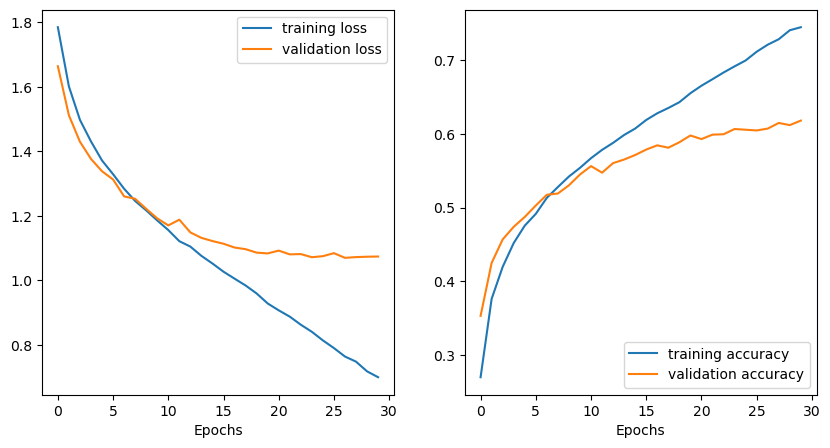

In [22]:
fig, axs = plt.subplots(1, 2, figsize=(10,5))
axs[0].plot(history.epoch, history.history['loss'])
axs[0].plot(history.epoch, history.history['val_loss'])
axs[0].legend(('training loss', 'validation loss'), loc='upper right')
axs[0].set_xlabel('Epochs');
axs[1].plot(history.epoch, history.history['accuracy'])
axs[1].plot(history.epoch, history.history['val_accuracy'])
axs[1].set_xlabel('Epochs');

axs[1].legend(('training accuracy', 'validation accuracy'), loc='lower right')
plt.show()

In [25]:
# Evaluate the model on the test data
loss, accuracy = emotion_model.evaluate(X_test, y_test)

# Print the test loss and accuracy
print("Test Loss:", loss)
print("Test Accuracy:", accuracy)

225/225 [==============================] - 5s 23ms/step - loss: 1.0742 - accuracy: 0.6181
Test Loss: 1.0742403268814087
Test Accuracy: 0.6181387305259705


In [27]:
# Save the model
emotion_model.save('initial_model_initial_dataset.h5')

In [29]:
from tensorflow.keras.models import load_model

# Load the saved model
emotion_model = load_model('initial_model_initial_dataset.h5')

# Fit the initial model on the augmented dataset with less variation in oversampling

In [30]:
# Lancement du modèle à 22:37
epochs = 30
batch_size = 64

with open('dataset_balanced.pickle', 'rb') as handle:
    data_dict = pickle.load(handle)

# Extract the data from the data_dict
X_train = data_dict['X_train']
X_test = data_dict['X_test']
y_train = data_dict['y_train']
y_test = data_dict['y_test']

history = emotion_model.fit(
        X_train, 
        y_train, 
        epochs=epochs, 
        batch_size=batch_size, 
        validation_data=(X_test, y_test))

Epoch 1/30
766/766 [==============================] - 190s 247ms/step - loss: 1.1995 - accuracy: 0.5560 - val_loss: 1.1058 - val_accuracy: 0.5939
Epoch 2/30
766/766 [==============================] - 211s 275ms/step - loss: 1.1030 - accuracy: 0.5943 - val_loss: 1.0870 - val_accuracy: 0.6052
Epoch 3/30
766/766 [==============================] - 209s 273ms/step - loss: 1.0429 - accuracy: 0.6170 - val_loss: 1.0913 - val_accuracy: 0.6048
Epoch 4/30
766/766 [==============================] - 211s 276ms/step - loss: 0.9996 - accuracy: 0.6323 - val_loss: 1.0935 - val_accuracy: 0.6059
Epoch 5/30
766/766 [==============================] - 226s 295ms/step - loss: 0.9555 - accuracy: 0.6510 - val_loss: 1.0631 - val_accuracy: 0.6128
Epoch 6/30
766/766 [==============================] - 959s 1s/step - loss: 0.9154 - accuracy: 0.6660 - val_loss: 1.0802 - val_accuracy: 0.6088
Epoch 7/30
766/766 [==============================] - 195s 254ms/step - loss: 0.8793 - accuracy: 0.6792 - val_loss: 1.0899 - va

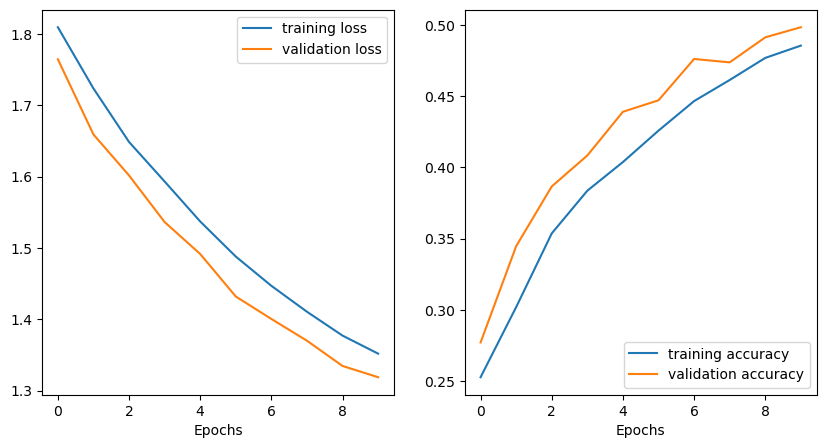

In [132]:
fig, axs = plt.subplots(1, 2, figsize=(10,5))
axs[0].plot(history.epoch, history.history['loss'])
axs[0].plot(history.epoch, history.history['val_loss'])
axs[0].legend(('training loss', 'validation loss'), loc='upper right')
axs[0].set_xlabel('Epochs');
axs[1].plot(history.epoch, history.history['accuracy'])
axs[1].plot(history.epoch, history.history['val_accuracy'])
axs[1].set_xlabel('Epochs');

axs[1].legend(('training accuracy', 'validation accuracy'), loc='lower right')
plt.show()

In [31]:
# Evaluate the model on the test data
loss, accuracy = emotion_model.evaluate(X_test, y_test)

# Print the test loss and accuracy
print("Test Loss:", loss)
print("Test Accuracy:", accuracy)

225/225 [==============================] - 5s 23ms/step - loss: 1.2705 - accuracy: 0.6173
Test Loss: 1.270472526550293
Test Accuracy: 0.6173028945922852


In [32]:
# Save the model
emotion_model.save('initial_model_dataset_balanced.h5')

In [33]:
from tensorflow.keras.models import load_model

# Load the saved model
emotion_model = load_model('initial_model_dataset_balanced.h5')

# Fit the initial model on the augmented dataset with more variation in oversampling

In [ ]:
# Lancement du modèle à 23:35
epochs = 30
batch_size = 64

with open('dataset_balanced2.pickle', 'rb') as handle:
    data_dict = pickle.load(handle)

# Extract the data from the data_dict
X_train = data_dict['X_train']
X_test = data_dict['X_test']
y_train = data_dict['y_train']
y_test = data_dict['y_test']

history = emotion_model.fit(
        X_train, 
        y_train, 
        epochs=epochs, 
        batch_size=batch_size, 
        validation_data=(X_test, y_test))

Epoch 1/30
449/449 [==============================] - 102s 225ms/step - loss: 1.7845 - accuracy: 0.2701 - val_loss: 1.6637 - val_accuracy: 0.3533
Epoch 2/30
449/449 [==============================] - 127s 283ms/step - loss: 1.6010 - accuracy: 0.3763 - val_loss: 1.5116 - val_accuracy: 0.4250
Epoch 3/30
449/449 [==============================] - 141s 314ms/step - loss: 1.4976 - accuracy: 0.4197 - val_loss: 1.4298 - val_accuracy: 0.4570
Epoch 4/30
449/449 [==============================] - 134s 298ms/step - loss: 1.4307 - accuracy: 0.4521 - val_loss: 1.3765 - val_accuracy: 0.4741
Epoch 5/30
449/449 [==============================] - 133s 297ms/step - loss: 1.3717 - accuracy: 0.4756 - val_loss: 1.3383 - val_accuracy: 0.4875
Epoch 6/30
449/449 [==============================] - 138s 307ms/step - loss: 1.3292 - accuracy: 0.4917 - val_loss: 1.3128 - val_accuracy: 0.5029
Epoch 7/30
449/449 [==============================] - 131s 292ms/step - loss: 1.2842 - accuracy: 0.5134 - val_loss: 1.2604 -

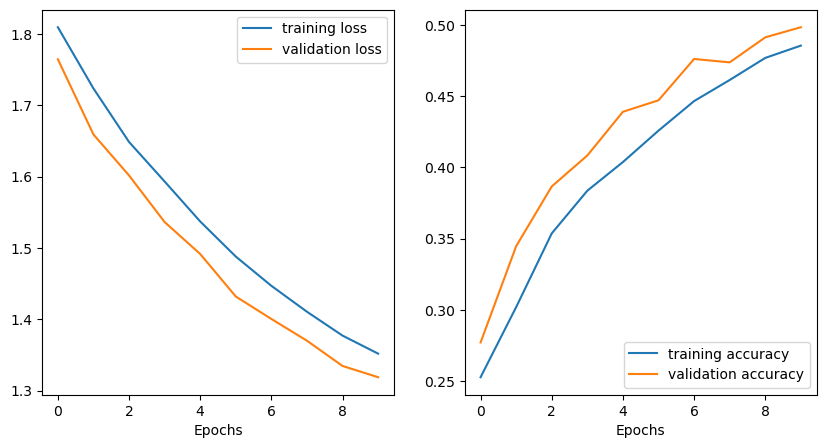

In [132]:
fig, axs = plt.subplots(1, 2, figsize=(10,5))
axs[0].plot(history.epoch, history.history['loss'])
axs[0].plot(history.epoch, history.history['val_loss'])
axs[0].legend(('training loss', 'validation loss'), loc='upper right')
axs[0].set_xlabel('Epochs');
axs[1].plot(history.epoch, history.history['accuracy'])
axs[1].plot(history.epoch, history.history['val_accuracy'])
axs[1].set_xlabel('Epochs');

axs[1].legend(('training accuracy', 'validation accuracy'), loc='lower right')
plt.show()

In [133]:
# Evaluate the model on the test data
loss, accuracy = emotion_model.evaluate(X_test, y_test)

# Print the test loss and accuracy
print("Test Loss:", loss)
print("Test Accuracy:", accuracy)

225/225 [==============================] - 6s 26ms/step - loss: 1.2368 - accuracy: 0.5288
Test loss: 1.2368205785751343
Test accuracy: 0.5288380980491638


In [ ]:
# Save the model
emotion_model.save('initial_model_dataset_balanced2.h5')

In [ ]:
from tensorflow.keras.models import load_model

# Load the saved model
emotion_model = load_model('initial_model_dataset_balanced2.h5')